## Importación librerías

In [77]:
import cv2
import numpy as np
import pandas as pd
import glob

from skimage.feature import graycomatrix, graycoprops
from skimage.measure import shannon_entropy
from skimage.filters.rank import entropy
from skimage.morphology import disk

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px

import os
import glob
import shutil
import random

## Carga de datos

In [78]:
df_dimensiones = pd.read_csv('artists_limpio.csv')

df_features = pd.read_csv('features.csv')

In [79]:
# Unimos dataframes de dimensiones y features

df_raw = pd.merge(df_dimensiones, df_features, left_on='name', right_on='artista').drop(columns='artista').rename(columns={'name': 'artista'})


## Limpieza

In [80]:
# Omitir del dataset las obras que son a lápiz, carboncillo, boceto
# Filtros para separar y remover bocetos.

ruta_fotos_originales = "resized/resized" 

autores_rebeldes = ['Marc Chagall', 'Pieter Bruegel the Elder', 'Vincent van Gogh']

cond_rebeldes = ((df_raw['artista'].isin(autores_rebeldes)) & (df_raw['brightness'] > 100) & (df_raw['saturation'] < 50))

cond_bruegel = ((df_raw['artista'] == 'Pieter Bruegel') & (df_raw['brightness'] > 100) & (df_raw['contrast'] > 1040) )

condicion_base = ((df_raw['brightness'] > 0) & (df_raw['saturation'] < 14))

cond_leonardo = (df_raw['artista'] == 'Leonardo da Vinci') & (df_raw['mean_r'] > 140) 

cond_van_gogh = ((df_raw['artista'] == 'Vincent van Gogh') & (df_raw['brightness'] > 60) & (df_raw['saturation'] < 40) )

cond_goya = ((df_raw['artista'] == 'Francisco Goya') & (df_raw['brightness'] > 100) & (df_raw['saturation'] < 50))

bocetos_no_detectados = (df_raw['nombre_archivo'].isin(['Francisco_Goya_34.jpg', 'Edgar_Degas_684.jpg', 'Edvard_Munch_23.jpg', 'Francisco_Goya_30.jpg', 'Francisco_Goya_146.jpg', 'Francisco_Goya_97.jpg', 'Francisco_Goya_60.jpg', 'Francisco_Goya_108.jpg', 'Francisco_Goya_157.jpg', 'Francisco_Goya_215.jpg', 
                                                    'Francisco_Goya_229.jpg', 'Gustav_Klimt_3.jpg', 'Gustav_Klimt_5.jpg', 'Gustav_Klimt_10.jpg', 'Gustav_Klimt_23.jpg',  'Gustav_Klimt_25.jpg', 'Gustav_Klimt_27.jpg', 'Gustav_Klimt_31.jpg', 'Gustav_Klimt_32.jpg', 'Gustav_Klimt_34.jpg',
                                                    'Gustav_Klimt_37.jpg', 'Gustav_Klimt_48.jpg', 'Gustav_Klimt_52.jpg', 'Gustav_Klimt_56.jpg', 'Gustav_Klimt_60.jpg', 'Gustav_Klimt_65.jpg', 'Gustav_Klimt_73.jpg', 'Gustav_Klimt_78.jpg', 'Gustav_Klimt_88.jpg', 'Gustav_Klimt_89.jpg', 'Gustav_Klimt_94.jpg',
                                                    'Gustav_Klimt_97.jpg', 'Gustav_Klimt_107.jpg', 'Gustav_Klimt_108.jpg', 'Gustav_Klimt_110.jpg', 'Gustav_Klimt_111.jpg', 'Gustav_Klimt_115.jpg', 'Henri_de_Toulouse-Lautrec_1.jpg', 'Henri_de_Toulouse-Lautrec_3.jpg', 'Henri_de_Toulouse-Lautrec_17.jpg',
                                                    'Henri_de_Toulouse-Lautrec_34.jpg', 'Henri_de_Toulouse-Lautrec_35.jpg', 'Henri_de_Toulouse-Lautrec_59.jpg', 'Hieronymus_Bosch_32.jpg', 'Hieronymus_Bosch_107.jpg', 'Jan_van_Eyck_71.jpg', 'Joan_Miro_4.jpg', 'Joan_Miro_6.jpg', 'Joan_Miro_15.jpg',
                                                    'Joan_Miro_23.jpg', 'Joan_Miro_29.jpg', 'Kazimir_Malevich_2.jpg', 'Kazimir_Malevich_10.jpg', 'Kazimir_Malevich_57.jpg', 'Mikhail_Vrubel_1.jpg', 'Mikhail_Vrubel_12.jpg', 'Mikhail_Vrubel_13.jpg', 'Mikhail_Vrubel_17.jpg', 'Mikhail_Vrubel_28.jpg', 
                                                    'Mikhail_Vrubel_45.jpg', 'Mikhail_Vrubel_47.jpg', 'Mikhail_Vrubel_70.jpg', 'Mikhail_Vrubel_80.jpg', 'Mikhail_Vrubel_120.jpg', 'Mikhail_Vrubel_121.jpg', 'Mikhail_Vrubel_153.jpg', 'Mikhail_Vrubel_154.jpg', 'Pablo_Picasso_13.jpg', 'Pablo_Picasso_84.jpg',
                                                    'Pablo_Picasso_93.jpg',  'Pablo_Picasso_143.jpg', 'Pablo_Picasso_154.jpg', 'Pablo_Picasso_179.jpg', 'Pablo_Picasso_181.jpg', 'Pablo_Picasso_183.jpg', 'Paul_Gauguin_5.jpg', 'Paul_Gauguin_15.jpg', 'Paul_Gauguin_19.jpg', 'Peter_Paul_Rubens_62.jpg', 
                                                    'Peter_Paul_Rubens_31.jpg', 'Peter_Paul_Rubens_89.jpg', 'Peter_Paul_Rubens_101.jpg', 'Peter_Paul_Rubens_111.jpg', 'Peter_Paul_Rubens_113.jpg', 'Pierre-Auguste_Renoir_127.jpg', 'Pieter_Bruegel_43.jpg', 'Pieter_Bruegel_99.jpg', 'Vasiliy_Kandinskiy_29.jpg'
                                                    'Vincent_van_Gogh_4.jpg', 'Vincent_van_Gogh_8.jpg', 'Vincent_van_Gogh_17.jpg', 'Vincent_van_Gogh_62.jpg', 'Vincent_van_Gogh_85.jpg', 'Vincent_van_Gogh_87.jpg', 'Vincent_van_Gogh_104.jpg', 'Vincent_van_Gogh_106.jpg',
                                                    'Vincent_van_Gogh_112.jpg', 'Vincent_van_Gogh_137.jpg', 'Vincent_van_Gogh_138.jpg','Vincent_van_Gogh_139.jpg', 'Vincent_van_Gogh_187.jpg','Vincent_van_Gogh_189.jpg', 'Vincent_van_Gogh_190.jpg', 'Vincent_van_Gogh_211.jpg', 'Vincent_van_Gogh_225.jpg',
                                                    'Vincent_van_Gogh_256.jpg', 'Vincent_van_Gogh_873.jpg', 'Vincent_van_Gogh_865.jpg', 'Vincent_van_Gogh_851.jpg', 'Vincent_van_Gogh_850.jpg', 'Vincent_van_Gogh_847.jpg', 'Vincent_van_Gogh_793.jpg', 'Vincent_van_Gogh_790.jpg',
                                                    'Vincent_van_Gogh_780.jpg', 'Vincent_van_Gogh_771.jpg', 'Vincent_van_Gogh_762.jpg', 'Vincent_van_Gogh_749.jpg', 'Vincent_van_Gogh_741.jpg', 'Vincent_van_Gogh_738.jpg', 'Vincent_van_Gogh_730.jpg', 'Vincent_van_Gogh_720.jpg',
                                                    'Vincent_van_Gogh_72.jpg', 'Vincent_van_Gogh_715.jpg', 'Vincent_van_Gogh_698.jpg', 'Vincent_van_Gogh_690.jpg', 'Vincent_van_Gogh_682.jpg', 'Vincent_van_Gogh_674.jpg', 'Vincent_van_Gogh_672.jpg', 'Vincent_van_Gogh_669.jpg', 
                                                    'Vincent_van_Gogh_258.jpg', 'Vincent_van_Gogh_362.jpg', 'Vincent_van_Gogh_839.jpg', 'Vincent_van_Gogh_705.jpg', 'Vincent_van_Gogh_678.jpg', 'Vincent_van_Gogh_662.jpg', 'Vincent_van_Gogh_639.jpg', 'Vincent_van_Gogh_628.jpg', 
                                                    'Vincent_van_Gogh_622.jpg', 'Vincent_van_Gogh_615.jpg', 'Vincent_van_Gogh_610.jpg', 'Vincent_van_Gogh_606.jpg', 'Vincent_van_Gogh_600.jpg', 'Vincent_van_Gogh_598.jpg', 'Vincent_van_Gogh_594.jpg', 'Vincent_van_Gogh_589.jpg', 'Vincent_van_Gogh_587.jpg',
                                                    'Vincent_van_Gogh_583.jpg', 'Vincent_van_Gogh_562.jpg', 'Vincent_van_Gogh_553.jpg', 'Vincent_van_Gogh_533.jpg', 'Vincent_van_Gogh_530.jpg', 'Vincent_van_Gogh_527.jpg', 'Vincent_van_Gogh_519.jpg', 'Vincent_van_Gogh_515.jpg', 'Vincent_van_Gogh_513.jpg', 'Vincent_van_Gogh_502.jpg',
                                                    'Vincent_van_Gogh_485.jpg','Vincent_van_Gogh_472.jpg', 'Vincent_van_Gogh_450.jpg', 'Vincent_van_Gogh_408.jpg', 'Vincent_van_Gogh_406.jpg', 'Vincent_van_Gogh_400.jpg', 'Vincent_van_Gogh_390.jpg', 'Vincent_van_Gogh_388.jpg', 'Vincent_van_Gogh_382.jpg', 'Vincent_van_Gogh_375.jpg', 'Vincent_van_Gogh_344.jpg',
                                                    'Vincent_van_Gogh_339.jpg', 'Vincent_van_Gogh_337.jpg', 'Vincent_van_Gogh_280.jpg', 'Vincent_van_Gogh_277.jpg', 'Vincent_van_Gogh_276.jpg', 'Vincent_van_Gogh_251.jpg', 'Vincent_van_Gogh_233.jpg', 'Vincent_van_Gogh_230.jpg', 'Vincent_van_Gogh_152.jpg' ]))

pinturas_confundidas = ['Andy_Warhol_176.jpg', 'Francisco_Goya_258.jpg', 'Marc_Chagall_94.jpg', 'Marc_Chagall_98.jpg', 'Marc_Chagall_189.jpg', 'Marc_Chagall_228.jpg', 'Vincent_van_Gogh_93.jpg', 'Vincent_van_Gogh_181.jpg', 'Vincent_van_Gogh_240.jpg', 'Vincent_van_Gogh_243.jpg', 'Vincent_van_Gogh_336.jpg',
                        'Vincent_van_Gogh_369.jpg', 'Vincent_van_Gogh_387.jpg', 'Vincent_van_Gogh_469.jpg', 'Vincent_van_Gogh_597.jpg', 'Vincent_van_Gogh_772.jpg', 'Kazimir_Malevich_89.jpg']

# UNIMOS TODAS: Si cumple CUALQUIERA de estas, es probablemente un boceto

condiciones_bocetos =((condicion_base | cond_leonardo | cond_rebeldes | cond_bruegel | cond_goya | cond_van_gogh | bocetos_no_detectados) & (~df_raw['nombre_archivo'].isin(pinturas_confundidas)))

# Filtro: 

sketches = df_raw[condiciones_bocetos]

El siguiente código sirve para crear la carpeta "dataset_solo_oleos" y revisar visualmente si nos estamos quedando con obras al óleo

In [81]:
# Ejecutar según necesidad

df = df_raw.drop(sketches.index).copy()

# ruta_destino_limpia = "dataset_solo_oleos"

# if not os.path.exists(ruta_destino_limpia):
#     os.makedirs(ruta_destino_limpia)

# for i, row in df_oleos.iterrows():
#     nombre_foto = row['nombre_archivo']
#     origen = os.path.join("resized/resized/", nombre_foto)
#     destino = os.path.join(ruta_destino_limpia, nombre_foto)
    
#     if os.path.exists(origen):
#         shutil.copy(origen, destino)


## Downsampling por movimiento, maximo 400 cuadros por movimiento

Para que la PCA y el clustering recojan información equilibrada por movimiento, y no estén sesgadas por clases mayoritarias

In [82]:
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

df_downsample = df.groupby("movement", group_keys=False).apply(lambda x: x.sample(n=400, random_state=42) if len(x) > 400 else x)

df_downsample.groupby('movement')['id'].count()


movement
Barroco                    400
Impresionismo              400
Post-impresionismo         400
Renacimiento               400
Romanticismo y Realismo    319
Vanguardias                400
Name: id, dtype: int64

Creamos columnas para poder ordenar las visualizaciones por movimiento artístico (orden cronológico)

In [83]:
movement_order = [
    "Renacimiento",
    "Barroco",
    "Romanticismo y Realismo",
    "Impresionismo",
    "Post-impresionismo",
    "Vanguardias"
]

df['movement'] = pd.Categorical(df['movement'], categories=movement_order, ordered=True)

df = df.sort_values('movement')

Visualizar una muestra de 5 artistas

In [84]:
df[['id', 'artista', 'movement', 'paintings', 'sub_estilo', 'nombre_archivo', 'mean_r', 'mean_g', 'mean_b', 'saturation', 'brightness', 'entropy', 'contrast', 'homogeneity', 'edge_density' ]].sample(n=5)

,id,artista,movement,paintings,sub_estilo,nombre_archivo,mean_r,mean_g,mean_b,saturation,brightness,entropy,contrast,homogeneity,edge_density
1501,27,Diego Velazquez,Barroco,128,Barroco,Diego_Velazquez_123.jpg,147.703453,112.960165,100.177076,80.589780,147.874501,7.850125,78.429471,0.270365,0.059985
6762,0,Amedeo Modigliani,Vanguardias,193,Expresionismo,Amedeo_Modigliani_186.jpg,115.899780,89.466942,77.195041,109.365544,116.700875,7.244921,131.710945,0.224039,0.054607
7795,45,Andy Warhol,Vanguardias,181,Pop Art,Andy_Warhol_142.jpg,81.121365,77.553477,55.887681,135.236596,95.024567,7.457028,784.183473,0.113291,0.234025
1004,32,Titian,Renacimiento,255,Renacimiento,Titian_51.jpg,34.815801,25.595461,17.555225,110.468164,34.882440,5.711738,47.289808,0.222095,0.008457
3708,15,Pierre-Auguste Renoir,Impresionismo,336,Impresionismo,Pierre-Auguste_Renoir_302.jpg,136.085717,83.985601,70.879964,134.066728,137.903444,7.354860,355.431870,0.081226,0.123087


## Análisis exploratorio (EDA)


Cómo es el dataset. Distribución de obras según movimiento

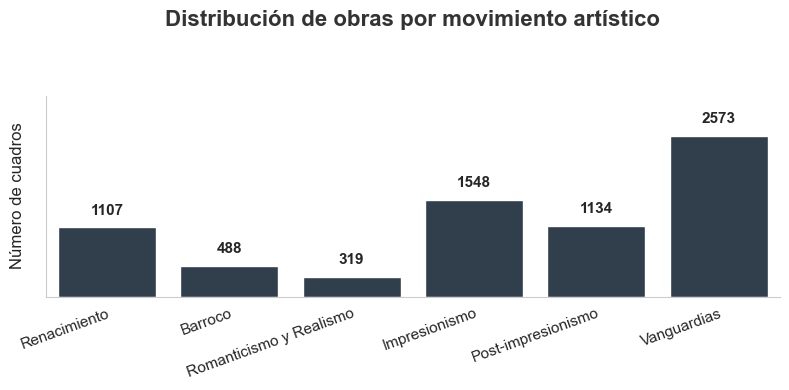

In [85]:
cuadros_movimiento = df.groupby('movement')['id'].count().reset_index()

sns.set_style("whitegrid", {'axes.grid': False})

plt.figure(figsize=(8, 4)) 

ax = sns.barplot(
    data=cuadros_movimiento, 
    x='movement', 
    y='id',
    color='#2c3e50'
)

plt.title('Distribución de obras por movimiento artístico', fontsize=16, pad=50, fontweight='bold', color='#333333')
plt.xlabel('', fontsize=12)
plt.ylabel('Número de cuadros', fontsize=12, labelpad=15)
sns.despine(left=False)
plt.yticks([])
plt.ylim(0, cuadros_movimiento['id'].max() * 1.25)
plt.xticks(rotation=20, ha='right', rotation_mode='anchor', fontsize=11)

for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 12), 
                textcoords = 'offset points',
                fontsize=11,
                fontweight='bold')

plt.tight_layout()
plt.show()

Porcentaje de cada movimiento dentro del dataset

In [86]:
df.groupby('movement')[['id']].count() / len(df) * 100

,id
movement,
Renacimiento,15.441484
Barroco,6.807086
Romanticismo y Realismo,4.449714
Impresionismo,21.592970
Post-impresionismo,15.818106
Vanguardias,35.890640


In [87]:
sun = df.dropna(subset=['movement', 'sub_estilo', 'artista']).copy()

fig = px.sunburst(
    sun,
    path=['movement', 'sub_estilo', 'artista'],
    width=800, 
    height=800,
)

fig.show()

In [88]:
df[df['nombre_archivo'] == 'Raphael_93.jpg'][['mean_r', 'mean_g', 'mean_b', 'saturation','brightness', 'entropy', 'contrast', 'homogeneity', 'edge_density','nombre_archivo']]

,mean_r,mean_g,mean_b,saturation,brightness,entropy,contrast,homogeneity,edge_density,nombre_archivo
795,90.34642,40.857832,27.372311,169.75153,91.899754,6.512132,49.022322,0.541555,0.038268,Raphael_93.jpg


Cómo son procesadas las features mediante cálculos de las librerías de python

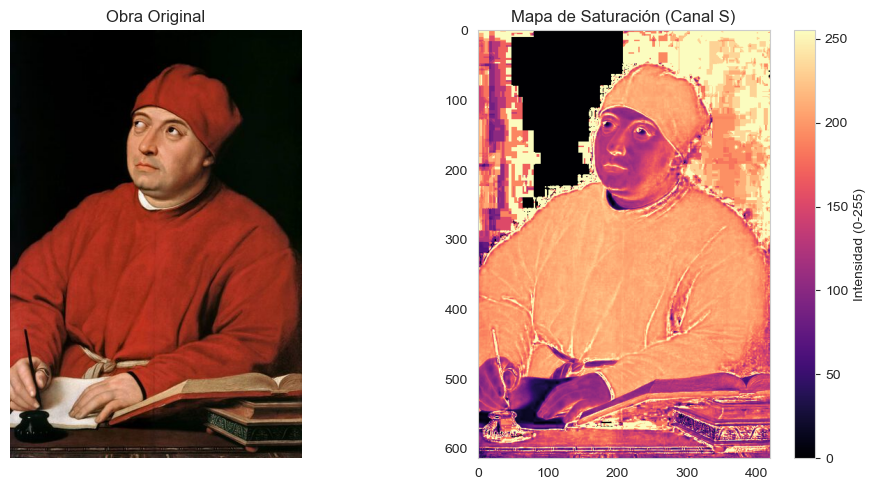

In [89]:
img_path = 'resized/resized/Raphael_93.jpg'
img = cv2.imread(img_path)

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title("Obra Original")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(s, cmap='magma')
plt.title("Mapa de Saturación (Canal S)")
plt.colorbar(label='Intensidad (0-255)')

plt.tight_layout()
plt.show()

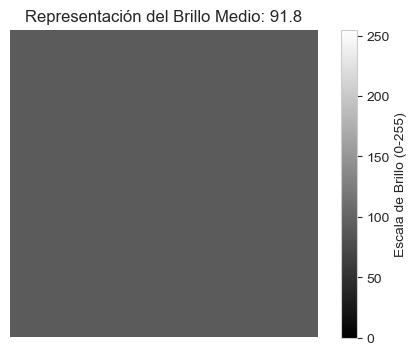

In [90]:
mean_v = 91.8

cuadrado_gris = np.full((100, 100), mean_v, dtype=np.uint8)

plt.figure(figsize=(6, 4))
plt.imshow(cuadrado_gris, cmap='gray', vmin=0, vmax=255)
plt.title(f"Representación del Brillo Medio: {mean_v}")
plt.axis('off')
plt.colorbar(label="Escala de Brillo (0-255)")
plt.show()

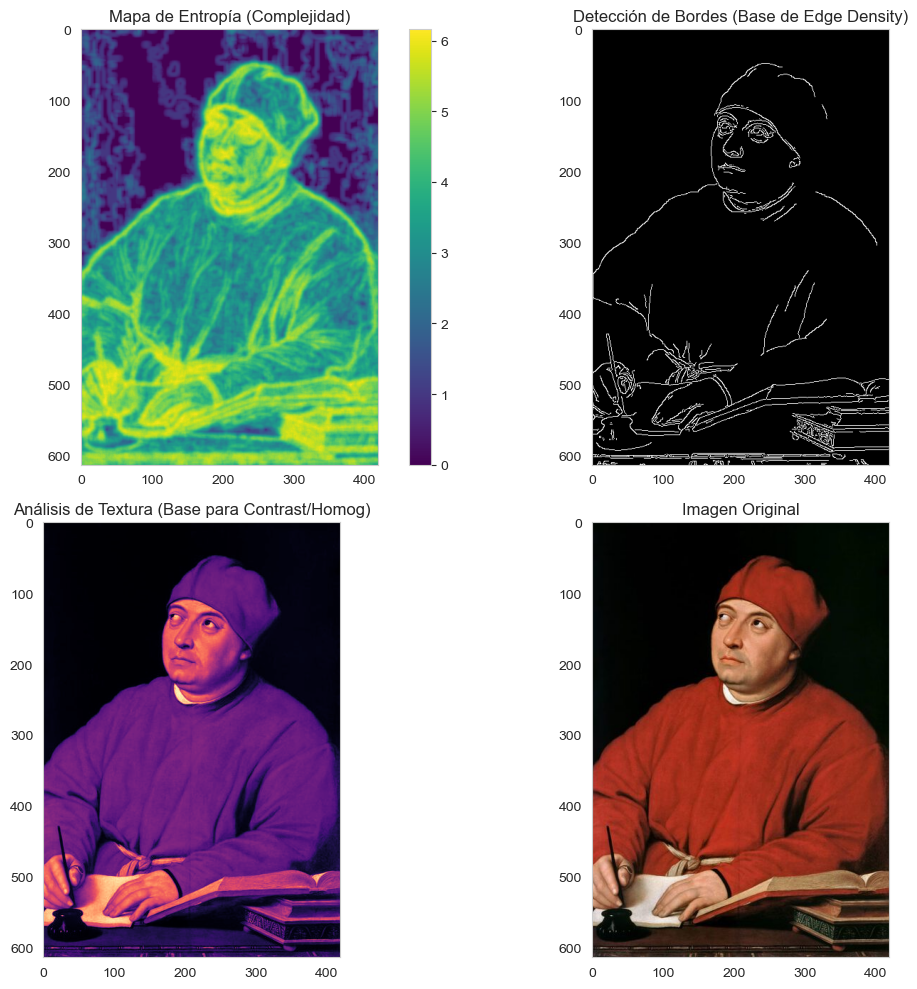

In [91]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

ent_map = entropy(gray, disk(5))

edges = cv2.Canny(gray, 100, 200)
edge_density_visual = cv2.GaussianBlur(edges.astype(float), (21, 21), 0)

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

im1 = axes[0, 0].imshow(ent_map, cmap='viridis')
axes[0, 0].set_title("Mapa de Entropía (Complejidad)")
plt.colorbar(im1, ax=axes[0, 0])

im2 = axes[0, 1].imshow(edges, cmap='gray')
axes[0, 1].set_title("Detección de Bordes (Base de Edge Density)")

im3 = axes[1, 0].imshow(gray, cmap='magma')
axes[1, 0].set_title("Análisis de Textura (Base para Contrast/Homog)")

axes[1, 1].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axes[1, 1].set_title("Imagen Original")

plt.tight_layout()
plt.show()

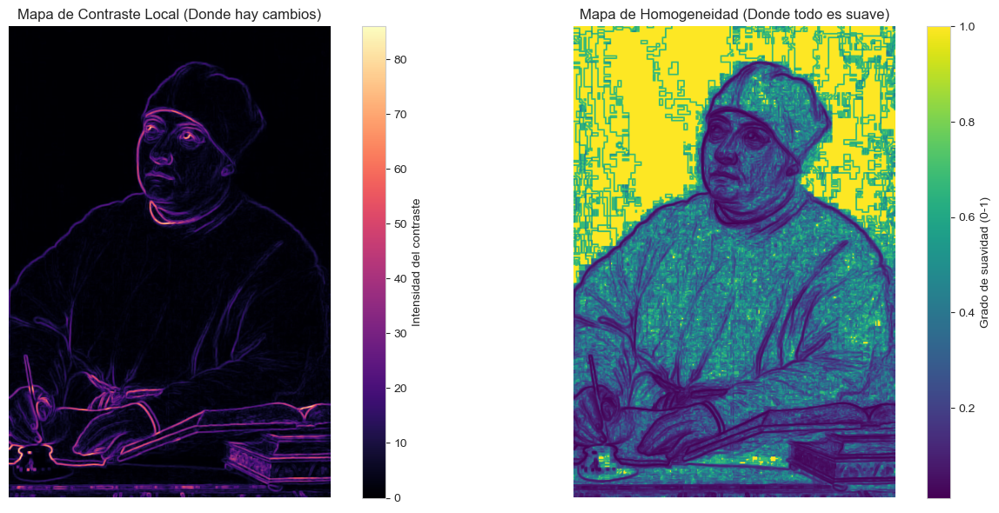

In [92]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(float)

mu = cv2.blur(gray, (3, 3))
mu_sq = cv2.blur(gray**2, (3, 3))
sigma = np.sqrt(np.abs(mu_sq - mu**2))

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
im1 = plt.imshow(sigma, cmap='magma') 
plt.title("Mapa de Contraste Local (Donde hay cambios)")
plt.colorbar(im1, label='Intensidad del contraste')
plt.axis('off')

homog_map = 1.0 / (1.0 + sigma)
plt.subplot(1, 2, 2)
im2 = plt.imshow(homog_map, cmap='viridis')
plt.title("Mapa de Homogeneidad (Donde todo es suave)")
plt.colorbar(im2, label='Grado de suavidad (0-1)')
plt.axis('off')

plt.tight_layout()
plt.show()

## PCA (Principal Component Analysis)

In [93]:
X = df_downsample.drop(columns=["id", "artista" ,'year_born', 'year_died', 'nationality', 'paintings', 'movement', 'sub_estilo', 'nombre_archivo']) # dataframe solo factores
X_scaled = StandardScaler().fit_transform(X)

pca = PCA(n_components=9)
X_pca = pca.fit_transform(X_scaled)

In [119]:
np.set_printoptions(precision=3, suppress=True)
pd.DataFrame(X_pca)

,0,1,2,3,4,5,6,7,8
0,-3.866379,-0.271046,-0.040242,-0.117039,-0.120169,-0.126569,0.077010,0.011910,-0.040569
1,-4.012435,0.777075,0.056340,-0.856788,0.688669,0.576270,0.058771,0.222420,-0.098933
2,-4.417537,0.530492,-1.343778,-0.049678,-0.764752,-0.579680,-0.142574,0.096698,0.100665
3,0.577162,0.440531,-0.306874,0.774310,0.161256,0.081464,-0.414012,-0.124883,0.041561
4,-4.250532,0.432563,-0.848798,-0.206426,-0.586318,-0.407012,-0.063349,0.114039,0.037007
...,...,...,...,...,...,...,...,...,...
2314,1.570386,-1.019410,1.634435,-0.818986,0.673983,-0.779916,-0.314347,-0.045699,0.184600
2315,0.497429,-0.220230,-0.642730,1.054510,-0.102780,0.498308,0.088296,-0.216792,0.015699
2316,1.623300,0.546215,-1.581556,-0.714484,1.251660,-0.746063,0.339336,0.013038,-0.058313
2317,2.019513,3.562824,0.349433,-0.047623,-0.568397,-0.029789,0.322102,0.496137,0.106234


In [97]:
X_scaled.var(0)

array([1., 1., 1., 1., 1., 1., 1., 1., 1.])

<Axes: >

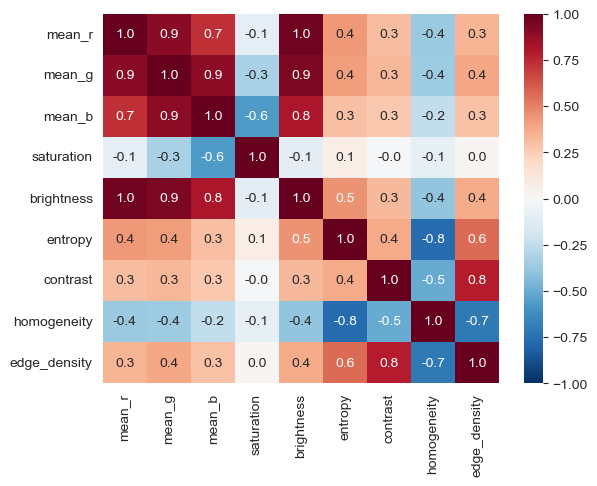

In [98]:
sns.heatmap(pd.DataFrame(X_scaled,columns =X.columns).corr(), cmap= 'RdBu_r', annot=True, fmt=".1f", vmin=-1, vmax=1, center=0)

Varianza acumulada. Los 2 primeros ejes responden al 75% de la varianza.

In [ ]:
np.cumsum(pca.explained_variance_)/sum(pca.explained_variance_)

array([0.527, 0.749, 0.862, 0.94 , 0.964, 0.981, 0.994, 0.999, 1.   ])

In [101]:
pca.explained_variance_

array([4.747, 1.994, 1.023, 0.696, 0.218, 0.154, 0.119, 0.045, 0.008])

Loadings. Qué parámetros son importantes para la PCA.

In [ ]:
loadings = pd.DataFrame(
    pca.components_[:2],
    columns=X.columns,
    index=["pca1", "pca2"]
)

loadings

,mean_r,mean_g,mean_b,saturation,brightness,entropy,contrast,homogeneity,edge_density
pca1,0.397465,0.415457,0.369142,-0.099069,0.412677,0.305527,0.268906,-0.302927,0.309212
pca2,0.197061,0.262803,0.359670,-0.399089,0.202307,-0.320473,-0.341893,0.417539,-0.410618


Contribución porcentual de las Variables a cada Componente Principal (PCA)

In [105]:
(loadings ** 2 * 100).style.background_gradient(cmap="Greens", axis= 1)

,mean_r,mean_g,mean_b,saturation,brightness,entropy,contrast,homogeneity,edge_density
pca1,15.797877,17.260419,13.626580,0.981467,17.030242,9.334695,7.231031,9.176452,9.561237
pca2,3.883293,6.906536,12.936240,15.927172,4.092810,10.270291,11.689065,17.433843,16.860749


Crear DataFrame con los componentes principales del PCA (componente 1 y 2 que recogen la máxima varianza)

In [ ]:
df_pca = pd.DataFrame(
    data=X_pca[:, :2],
    columns=['pca1', 'pca2'],
    index=df_downsample.index # Crucial: mantenemos los índices originales
)

df_pca[['artista', 'movement', 'sub_estilo', 'nombre_archivo']] = df_downsample[['artista', 'movement', 'sub_estilo', 'nombre_archivo']]

In [107]:
df_pca

,pca1,pca2,artista,movement,sub_estilo,nombre_archivo
1353,-3.866379,-0.271046,Peter Paul Rubens,Barroco,Barroco,Peter_Paul_Rubens_117.jpg
1529,-4.012435,0.777075,Rembrandt,Barroco,Barroco,Rembrandt_115.jpg
1722,-4.417537,0.530492,Rembrandt,Barroco,Barroco,Rembrandt_53.jpg
1360,0.577162,0.440531,Peter Paul Rubens,Barroco,Barroco,Peter_Paul_Rubens_123.jpg
1687,-4.250532,0.432563,Rembrandt,Barroco,Barroco,Rembrandt_258.jpg
...,...,...,...,...,...,...
6648,1.570386,-1.019410,Pablo Picasso,Vanguardias,Cubismo,Pablo_Picasso_83.jpg
5471,0.497429,-0.220230,Edvard Munch,Vanguardias,Expresionismo,Edvard_Munch_7.jpg
7265,1.623300,0.546215,Joan Miro,Vanguardias,Surrealismo,Joan_Miro_95.jpg
5293,2.019513,3.562824,Gustav Klimt,Vanguardias,Simbolismo,Gustav_Klimt_101.jpg


Visualización de la PCA

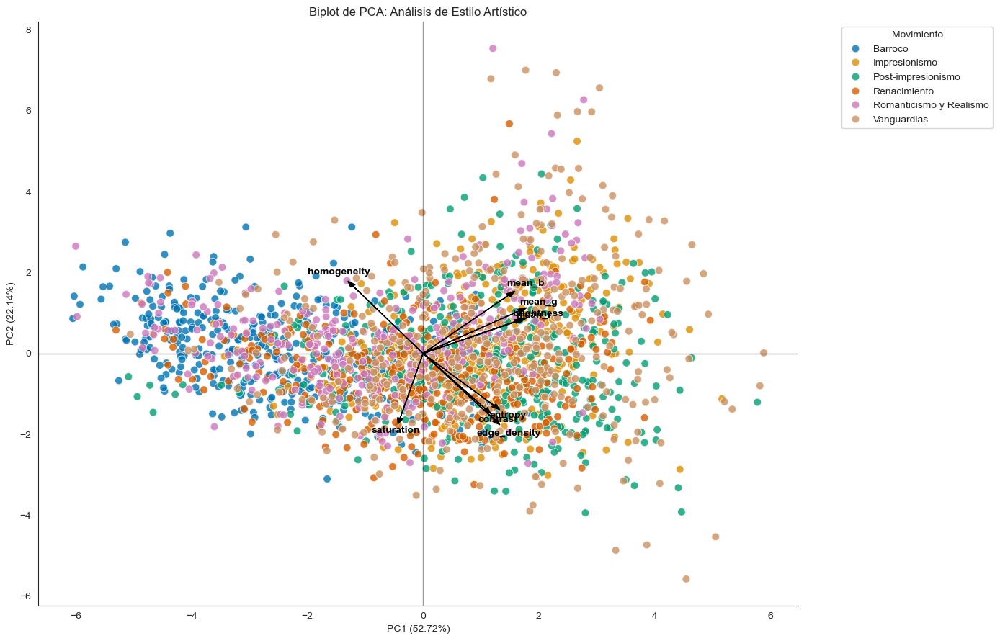

In [121]:
pc_x = 0
pc_y = 1

var_exp = pca.explained_variance_ratio_ * 100

sns.set_style("white") 
plt.figure(figsize=(14, 9))

sns.scatterplot(data=df_pca, x='pca1', y='pca2', hue='movement', palette='colorblind', s=60, alpha=0.8)

scale_factor = 4
features = X.columns

for i, feature_name in enumerate(features):
    plt.arrow(0, 0, 
              pca.components_[pc_x, i] * scale_factor, 
              pca.components_[pc_y, i] * scale_factor, 
              color='black', alpha=1, head_width=0.1)
    
    plt.text(pca.components_[pc_x, i] * scale_factor * 1.2, 
             pca.components_[pc_y, i] * scale_factor * 1.2, 
             feature_name, color='black', ha='center', va='center', fontweight='bold')

plt.axhline(0, color='black', linewidth=1, alpha=0.4)
plt.axvline(0, color='black', linewidth=1, alpha=0.4)

sns.despine()
plt.xlabel(f'PC1 ({var_exp[pc_x]:.2f}%)')
plt.ylabel(f'PC2 ({var_exp[pc_y]:.2f}%)')
plt.title('Biplot de PCA: Análisis de Estilo Artístico')
plt.legend(title='Movimiento', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


Visualizador interactivo para explorar obras de arte en el gráfico

In [122]:
fig = px.scatter(
    df_pca, 
    x='pca1', 
    y='pca2', 
    color='movement',
    hover_name=df_pca['nombre_archivo'],
    title='Explorador Interactivo de PCA',
    labels={'pca1': 'PC1 (Luz)', 'pca2': 'PC2 (Textura)'},
    template='plotly_white',
    width=1200,
    height=800,
    color_discrete_sequence=px.colors.qualitative.Bold,
)

fig.update_traces(marker=dict(size=6))
fig.show()

Subplots de la PCA para poder ver dispersión de cada movimiento artístico (ordenados cronológicamente)

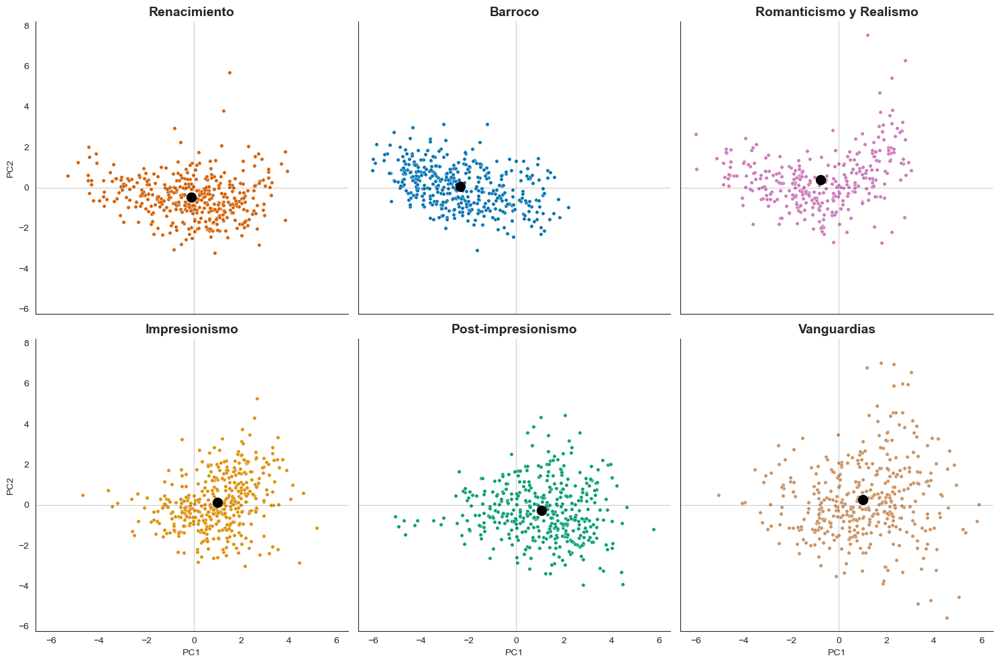

In [124]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("white")
scale_factor = 4       

centros = df_pca.groupby('movement')[['pca1', 'pca2']].mean().reset_index()

movement_order = [
    "Renacimiento",
    "Barroco",
    "Romanticismo y Realismo",
    "Impresionismo",
    "Post-impresionismo",
    "Vanguardias"
]

g = sns.FacetGrid(
    df_pca, 
    col="movement", 
    hue="movement", 
    col_wrap=3, 
    height=5, 
    palette='colorblind', 
    col_order=movement_order
)

g.map(sns.scatterplot, "pca1", "pca2", s=15, alpha=1)

for ax in g.axes.flatten():
    full_title = ax.get_title()
    mov_actual = full_title.split('= ')[-1]

    centro_mov = centros[centros['movement'] == mov_actual]
    
    if not centro_mov.empty:
        ax.scatter(centro_mov['pca1'], centro_mov['pca2'], color='black', s=100, zorder=10, label='Centroide')
    
    ax.axhline(0, color='black', lw=0.8, alpha=0.2) 
    ax.axvline(0, color='black', lw=0.8, alpha=0.2)
    ax.set_title(mov_actual, fontweight='bold', fontsize=14) 
    ax.grid(False)

g.set_axis_labels("PC1", "PC2")
plt.tight_layout()
plt.show()

## CLUSTERING

In [130]:
from sklearn.cluster import KMeans

X = df_downsample.drop(columns=["id", "artista" ,'year_born', 'year_died', 'nationality', 'paintings', 'movement', 'sub_estilo', 'nombre_archivo']) # dataframe solo factores
X_scaled = StandardScaler().fit_transform(X)

kmeans = KMeans(n_clusters=4)
df_pca["cluster"] = kmeans.fit_predict(X_scaled)

Método del codo para seleccionar cuantos clústeres determinamos

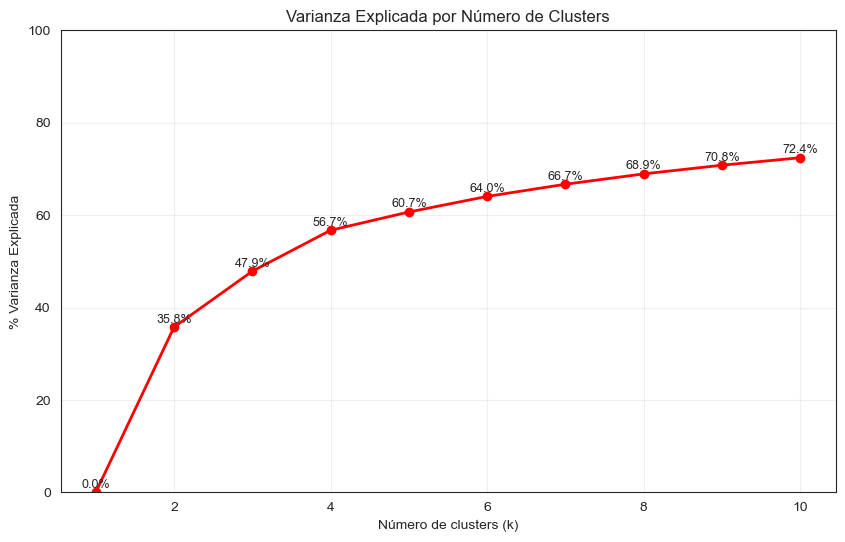

In [131]:
import numpy as np

inercia = []
K = range(1, 11)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    inercia.append(kmeans.inertia_)

varianza_total = inercia[0]

varianza_explicada = [(1 - (i / varianza_total)) * 100 for i in inercia]

plt.figure(figsize=(10, 6))
plt.plot(K, varianza_explicada, 'ro-', linewidth=2)

for x, y in zip(K, varianza_explicada):
    plt.text(x, y + 1, f'{y:.1f}%', ha='center', fontsize=9)

plt.xlabel('Número de clusters (k)')
plt.ylabel('% Varianza Explicada')
plt.title('Varianza Explicada por Número de Clusters')
plt.grid(True, alpha=0.3)
plt.ylim(0, 100)
plt.show()

Mapa de calor. Responde a si los clusteres que se forman coinciden con la etapa artística.
Normalizamos por índice para saber qué porcentaje de cada movimiento se agrupa en cada cluster.

In [ ]:
taula = pd.crosstab(df["movement"], df_pca["cluster"], normalize= 'index') *100
taula = taula.reindex(movement_order)
taula.style.background_gradient(cmap="Reds", axis= 1)

cluster,0,1,2,3
movement,,,,
Renacimiento,7.500000,15.500000,28.000000,49.000000
Barroco,2.000000,59.000000,4.250000,34.750000
Romanticismo y Realismo,23.197492,24.764890,5.329154,46.708464
Impresionismo,34.750000,1.750000,25.000000,38.500000
Post-impresionismo,24.000000,5.500000,39.250000,31.250000
Vanguardias,33.000000,7.000000,27.750000,32.250000


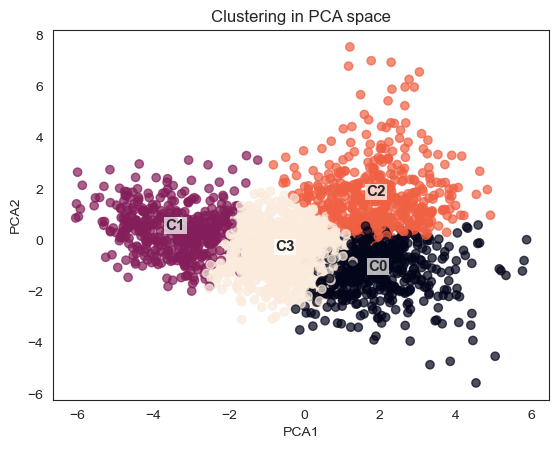

In [132]:
import warnings
warnings.filterwarnings('ignore')

plt.scatter(df_pca["pca1"], df_pca["pca2"], c=df_pca["cluster"], alpha=0.7)

for i in range(kmeans.n_clusters):
    # Localizamos el centro de la nube de puntos del cluster i
    centro = df_pca[df_pca["cluster"] == i][["pca1", "pca2"]].mean()
    
    plt.text(centro[0], centro[1], f"C{i}", 
             fontsize=11, fontweight='bold', ha='center',
             bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=1))


plt.xlabel("PCA1")
plt.ylabel("PCA2")
plt.title("Clustering in PCA space")
plt.show()

## Otras visualizaciones
### Evolución de los ejes principales detectados por la PCA

EVOLUCIÓN DE LA LUZ-OSCURIDAD (Eje principal)

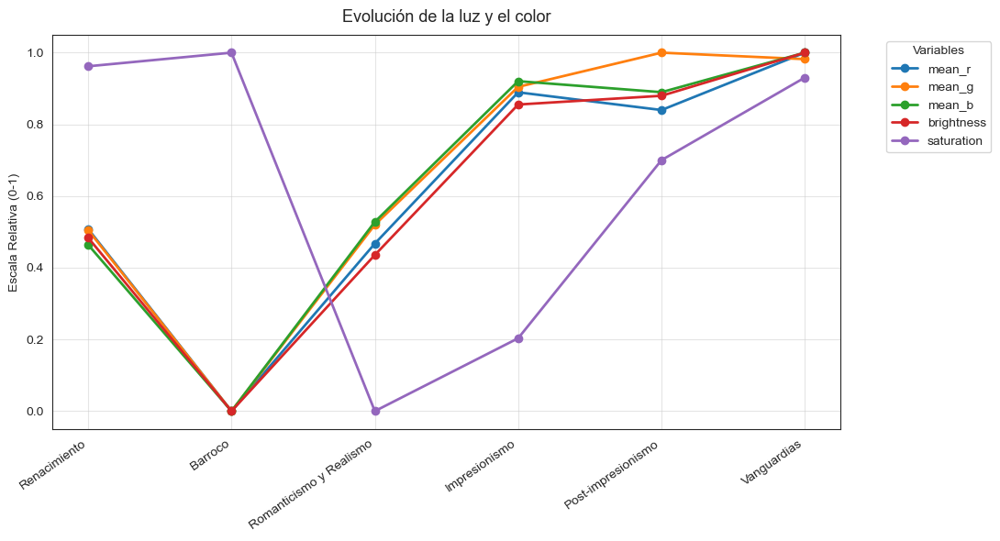

In [ ]:
variables = ['mean_r', 'mean_g', 'mean_b','brightness', 'saturation']

resumen = df.groupby('movement')[variables].mean().reindex(movement_order)

resumen_norm = (resumen - resumen.min()) / (resumen.max() - resumen.min()) # Normalización para comparar entre valores diferentes

plt.figure(figsize=(11, 6))

for col in resumen_norm.columns:
    plt.plot(resumen_norm.index, resumen_norm[col], marker='o', label=col, linewidth=2, )

plt.title('Evolución de la luz y el color', fontsize=13, pad=10)
plt.ylabel('Escala Relativa (0-1)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Variables")
plt.xticks(rotation=35, ha='right')
plt.grid( True, alpha=0.5)
plt.tight_layout()
plt.show()

EVOLUCIÓN DE LA COMPLEJIDAD DE LA OBRA (Eje secundario)

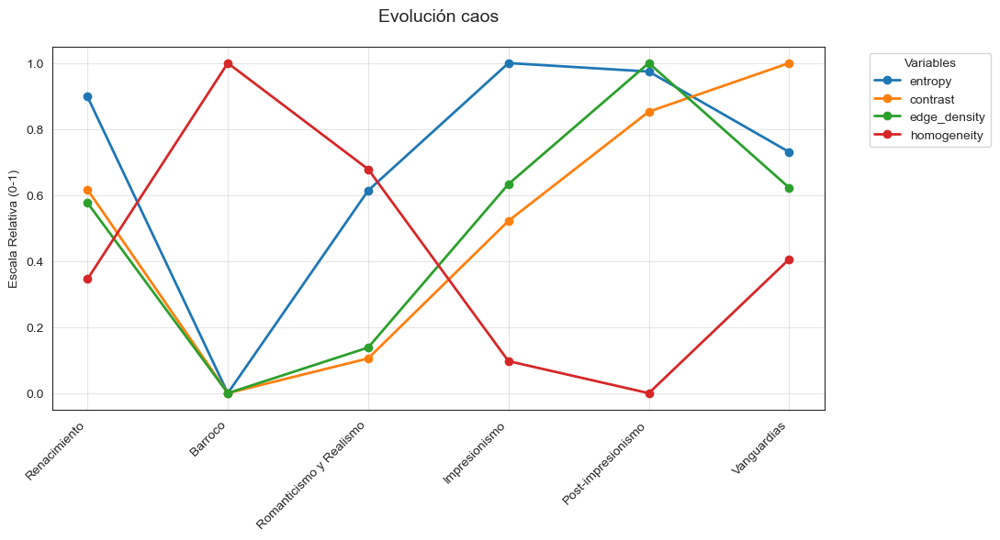

In [ ]:
variables = ['entropy', 'contrast', 'edge_density', 'homogeneity']

resumen = df.groupby('movement')[variables].mean().reindex(movement_order)

resumen_norm = (resumen - resumen.min()) / (resumen.max() - resumen.min())

plt.figure(figsize=(11, 6))

for col in resumen_norm.columns:
    plt.plot(resumen_norm.index, resumen_norm[col], marker='o', label=col, linewidth=2)

plt.title('Evolución caos', fontsize=14, pad=20)
plt.ylabel('Escala Relativa (0-1)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Variables")
plt.xticks(rotation=45, ha='right')
plt.grid( True, alpha=0.5)
plt.tight_layout()
plt.show()

Boxplots para observar diferencias entre estilos

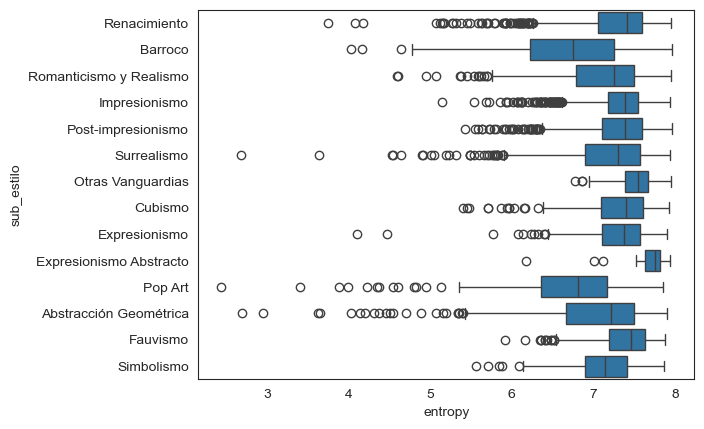

In [ ]:
sns.boxplot(df, x = "entropy", y = "sub_estilo");

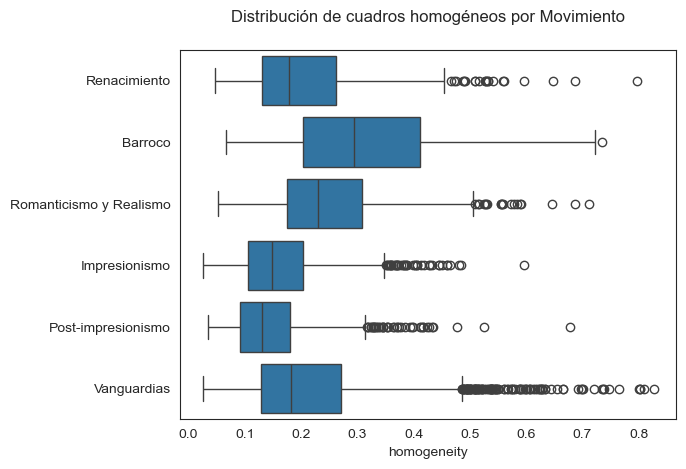

In [ ]:
sns.boxplot(df, x = "homogeneity", y = "movement")

plt.title("Distribución de cuadros homogéneos por Movimiento", fontsize=12, pad=20)
plt.ylabel(None);


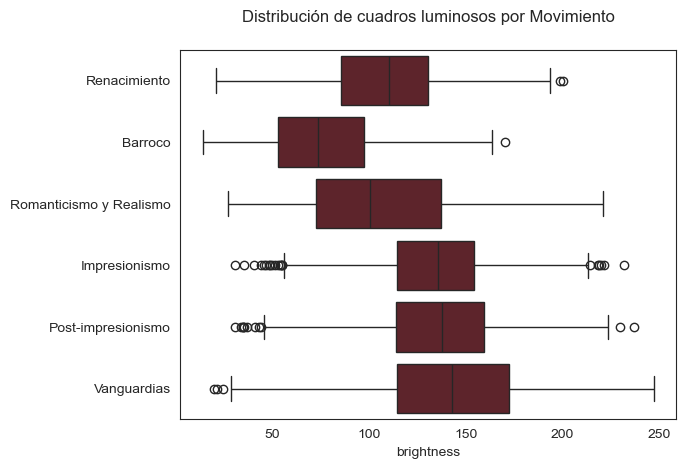

In [ ]:
sns.boxplot(df, x = "brightness", y = "movement", color="#661A24")

plt.title("Distribución de cuadros luminosos por Movimiento", fontsize=12, pad=20)
plt.ylabel(None);

## MACHINE LEARNING SUPERVISADO - RANDOM FOREST

Preparar datos

In [142]:
X = df[['mean_r', 
        'mean_g', 
        'mean_b', 
        'saturation',
        'brightness', 
        'entropy', 
        'contrast', 
        'homogeneity', 
        'edge_density']] 

y = df['movement']

Train / Test split

In [143]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

SMOTE (Synthetic Minority Over-sampling Technique)

Sólo se aplica al set de entrenamiento (train)

In [144]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42, k_neighbors=3)

X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

print("Antes de SMOTE:", y_train.value_counts())
print("Después de SMOTE:", y_train_res.value_counts())

Antes de SMOTE: movement
Vanguardias                2058
Impresionismo              1238
Post-impresionismo          907
Renacimiento                886
Barroco                     391
Romanticismo y Realismo     255
Name: count, dtype: int64
Después de SMOTE: movement
Renacimiento               2058
Barroco                    2058
Romanticismo y Realismo    2058
Impresionismo              2058
Post-impresionismo         2058
Vanguardias                2058
Name: count, dtype: int64


Random Forest

In [145]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(
    n_estimators=2000,
    random_state=42,
    n_jobs=-1
)

# rf.fit(X_train, y_train)
rf.fit(X_train_res, y_train_res)

,n_estimators,2000
,criterion,'gini'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


Predicción y evaluación básica

In [146]:
y_pred = rf.predict(X_test)

In [147]:
from sklearn.metrics import accuracy_score

accuracy_score(y_test, y_pred)

0.5125523012552301

Matriz de confusión

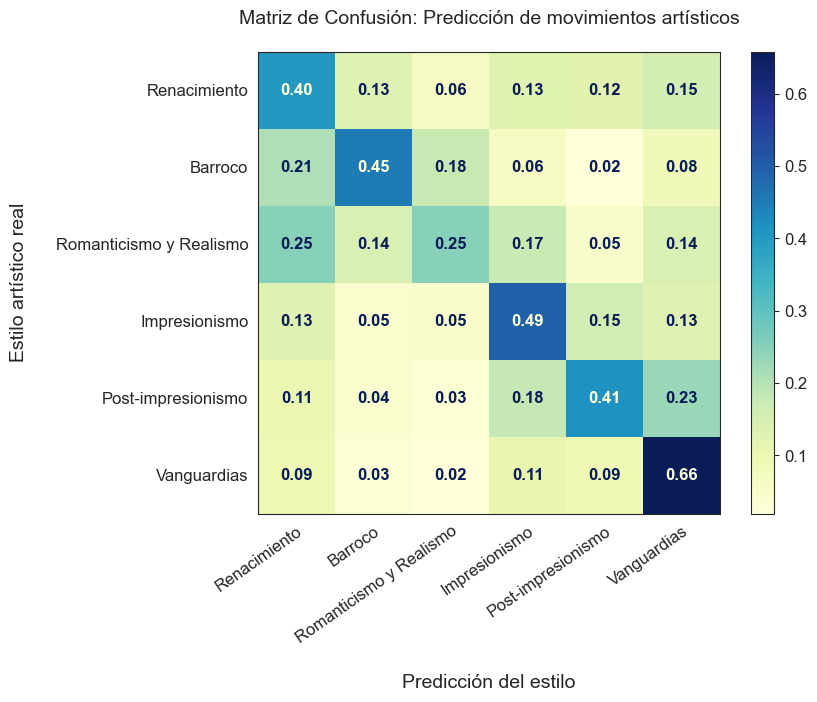

In [148]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

plt.rcParams.update({'font.size': 12})
fig, ax = plt.subplots(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred, labels=movement_order, normalize='true')

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=movement_order
)

disp.plot(xticks_rotation=35, ax=ax, cmap='YlGnBu', values_format='.2f', text_kw={'fontweight':'bold'})
plt.setp(ax.get_xticklabels(), ha="right", rotation_mode="anchor")
ax.set_title('Matriz de Confusión: Predicción de movimientos artísticos', fontsize=14, pad=20)
ax.grid(False)
ax.set_xlabel('Predicción del estilo', fontsize=14, labelpad=20,)
ax.set_ylabel('Estilo artístico real', fontsize=14, labelpad=20)
plt.grid(False)

Filas estilo real, columnas valor predicho. 

Mucho valor en la diagonal, modelo funciona. 

Valores fuera → estilos confundidos



Importancia de variables a la hora de predecir.

In [166]:
importances = pd.Series(
    rf.feature_importances_,
    index=X.columns
).sort_values(ascending=False)

importances

contrast        0.139769
edge_density    0.116497
brightness      0.113503
homogeneity     0.111463
mean_g          0.111038
saturation      0.105822
mean_b          0.101558
entropy         0.100182
mean_r          0.100168
dtype: float64

## Test

In [182]:
def extract_features(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) 
    mean_r, mean_g, mean_b = img.mean(axis=(0,1))
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    _, s, v = cv2.split(hsv)
    mean_saturation = s.mean()
    mean_brightness = v.mean()
    entropy = shannon_entropy(gray)
    glcm = graycomatrix(gray, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)
    contrast = graycoprops(glcm, 'contrast')[0,0] 
    homogeneity = graycoprops(glcm, 'homogeneity')[0,0]
    edges = cv2.Canny(gray, 100, 200)
    edge_density = edges.mean() / 255
    return {
        "mean_r": mean_r,
        "mean_g": mean_g,
        "mean_b": mean_b,
        "saturation": mean_saturation,
        "brightness": mean_brightness,
        "entropy": entropy,
        "contrast": contrast,
        "homogeneity": homogeneity,
        "edge_density": edge_density}


In [183]:
rows = []
lista_imagenes = glob.glob("test/*.jpg")
lista_imagenes = sorted(glob.glob("test/*.jpg"), key=lambda x: int(os.path.basename(x).split('_')[0])) # Ordenar

for img_path in lista_imagenes:
    feats = extract_features(img_path)
    nombre_archivo = os.path.basename(img_path)
    feats['nombre_archivo'] = nombre_archivo
    rows.append(feats)
prova = pd.DataFrame(rows)

In [184]:
X_prova = prova.drop(columns=('nombre_archivo'))

In [185]:
prova['predicted_movement'] = rf.predict(X_prova)

In [193]:
probs = rf.predict_proba(X_prova)
probs_df = pd.DataFrame(probs, columns=rf.classes_)

In [187]:
results = pd.concat([prova[['nombre_archivo']], 
                     prova['predicted_movement'],
                     probs_df], axis=1)


In [ ]:
lista_imagenes = glob.glob("test/*.jpg")
lista_imagenes = sorted(glob.glob("test/*.jpg"), key=lambda x: int(os.path.basename(x).split('_')[0])) # per ordenar 
prova['path'] = lista_imagenes

prova['predicted'] = rf.predict(X_prova)
prova['prob'] = probs_df.max(axis=1)

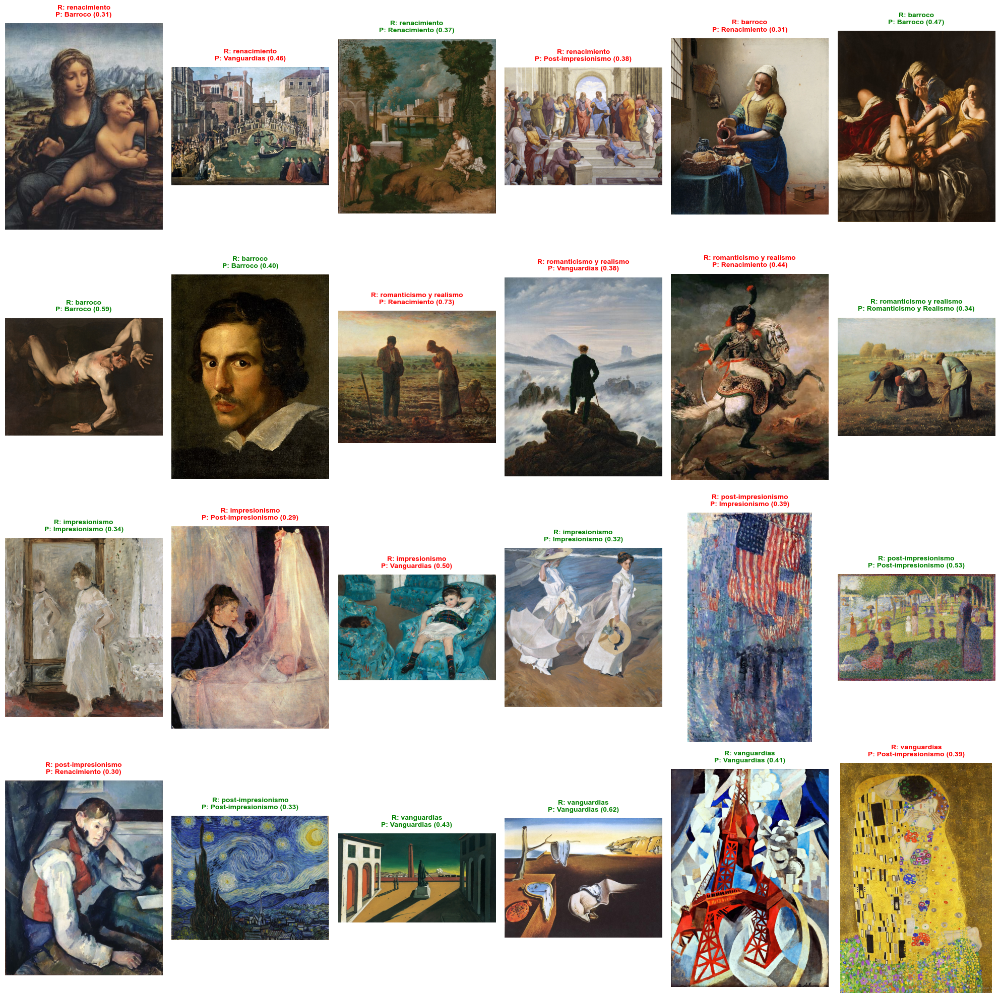

In [ ]:
import math

cols = 6
rows = math.ceil(len(prova) / cols)

fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
axes = axes.flatten() 

for i, (idx, row) in enumerate(prova.iterrows()):
    img = cv2.imread(row['path'])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    ax = axes[i]
    ax.imshow(img)
    ax.axis("off")
    
    real_name = row['nombre_archivo'].replace('.jpg', '').split('_')[-1]
    pred_name = row['predicted']
    prob = row['prob']

    color = 'green' if real_name.lower() == pred_name.lower() else 'red'
    
    ax.set_title(f"R: {real_name}\nP: {pred_name} ({prob:.2f})", 
                 fontsize=10, color=color, fontweight='bold', pad=10)

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

## Resultados test

Función para extraer el movimiento del nombre del archivo y calcular precisión del test.

In [196]:
def extraer_movimiento(path):
    nombre_archivo = path.split('/')[-1]
    partes = nombre_archivo.replace('.jpg', '').split('_')
    return partes[-1].capitalize()

prova['real_movement'] = prova['path'].apply(extraer_movimiento)

prova['hit'] = prova['predicted'].str.lower() == prova['real_movement'].str.lower()

accuracy_test = prova['hit'].mean() * 100

print(f"--- RESULTADOS DEL MINI-TEST ---")
print(f"Precisión total: {accuracy_test:.2f}%")
pd.DataFrame(prova[['path', 'real_movement', 'predicted', 'hit']])

--- RESULTADOS DEL MINI-TEST ---
Precisión total: 50.00%


,path,real_movement,predicted,hit
0,test\1_Donatello_renacimiento.jpg,Renacimiento,Barroco,False
1,test\2_bellini_renacimiento.jpg,Renacimiento,Vanguardias,False
2,test\3_giorgione_renacimiento.jpg,Renacimiento,Renacimiento,True
3,test\4_raphael_renacimiento.jpg,Renacimiento,Post-impresionismo,False
4,test\7_vermeer_barroco.jpg,Barroco,Renacimiento,False
5,test\8_artemisia_gentileschi_barroco.jpg,Barroco,Barroco,True
6,test\9_ribera_barroco.jpg,Barroco,Barroco,True
7,test\10_bernini_barroco.jpg,Barroco,Barroco,True
8,test\11_millet_romanticismo y realismo.jpg,Romanticismo y realismo,Renacimiento,False
9,test\12_friedrich_romanticismo y realismo.jpg,Romanticismo y realismo,Vanguardias,False
